# DEtection TRansformer Demonstration

In this notebook, we are going to demonstrate how the DETR model proposed by Carion et al. 2020 (Facebook AI)work on object detection of the COCO dataset, which is a large-scale image recognition dataset for object detection. (COCO dataset guide: https://www.v7labs.com/blog/coco-dataset-guide)

Introduction of DETR (DEtection TRansformer): 
Figure 1 below shows a very rough architecture of DETR. The images will first go to a CNN backbone following by an transformer encoder and decoder. 

The main highlights of DETR architecture are:
(1) End-to-end object detection. DETR does not require anchor boxes and post-processing (Non-Maximum Suppression), which makes it to have a simple pipeline. No region proposal is required. 

(2) Fixed size of output set. It predicts a fixed number of objects as a set, regardless of the number of objects in the image content. In addition, they use bipartite matching loss to ensure one-to-one matching between predicted class and ground truth class. 

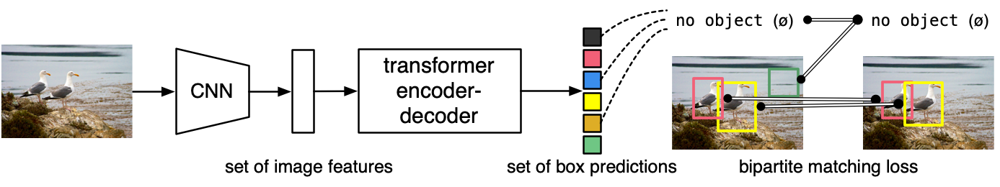


This demonstration is modified on a google colab DETR example with more experiments.

In addition, Yannic Kilcher also did a very good explanation about DETR, especially of his analogy to object queries -- an important component in the transformer decoder. Here is the link to the YouTube video: https://www.youtube.com/watch?v=T35ba_VXkMY&t=1693s. 


## Detection
### Part 2: Visualize encoder-decoder multi-head attention weights 

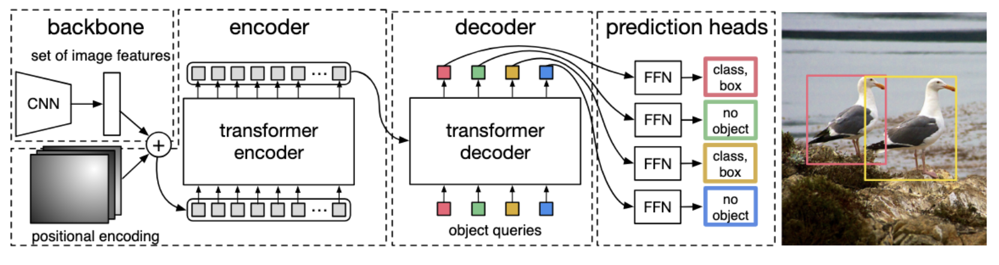

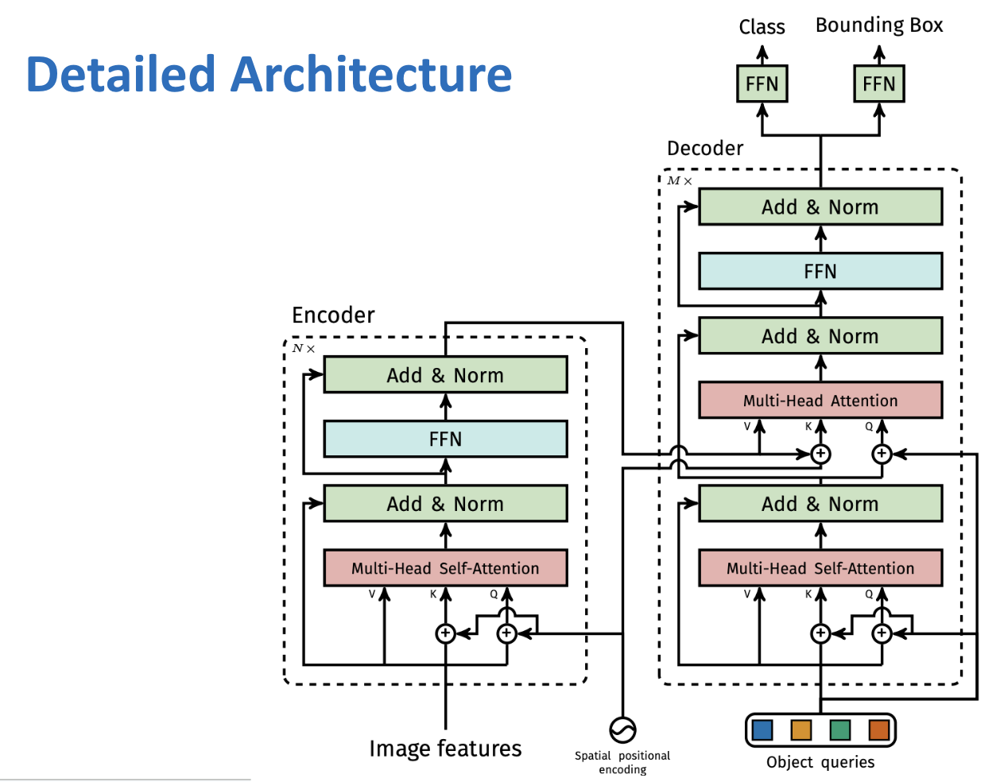

Above is a detailed drawing of the transformer used in DETR. 


## Demo Content Page
In this notebook, we will demonstrate how to: 
(1) Use the pre-trained models 

## Preliminaries
** The code below copied from the detr_hands_on.ipynb directly to set things up first. 

In [52]:
! pip install matplotlib
! pip install ipywidgets
! pip install transformers


[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: pip install --upgrade pip
^C
Traceback (most recent call last):
  File "/files/smooi/pytorch_env/pytorch_env/bin/pip", line 5, in <module>
    from pip._internal.cli.main import main
  File "/files/smooi/pytorch_env/pytorch_env/lib/python3.13/site-packages/pip/_internal/cli/main.py", line 11, in <module>
    from pip._internal.cli.autocompletion import autocomplete
  File "/files/smooi/pytorch_env/pytorch_env/lib/python3.13/site-packages/pip/_internal/cli/autocompletion.py", line 10, in <module>
    from pip._internal.cli.main_parser import create_main_parser
  File "/files/smooi/pytorch_env/pytorch_env/lib/python3.13/site-packages/pip/_internal/cli/main_parser.py", line 9, in <module>
    from pip._internal.build_env import get_runnable_pip
  File "/files/smooi/pytorch_env/pytorch_env/lib/pyt

In [39]:
import math

from PIL import Image
import requests
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

import ipywidgets as widgets
from IPython.display import display, clear_output

import torch
from torch import nn
from torchvision.models import resnet50
import torchvision.transforms as T
torch.set_grad_enabled(False)

In [40]:
# The model we are running below are specifically trained for the COCO dataset

# To do that, we have to first load the class categories that the COCO-trained models can detect
# "N/A" refers to the empty set / unsured output
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'remote',
    'toothbrush'
]

# colors for visualization: the color will be applied to the bounding boxes for displaying the object detection results 
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

Next, we will perform image proprocessing and bound box post-processing for object detection modules in Pytorch. We also added comments in the functions below to make the steps clearer for us. 

In [41]:
# standard PyTorch mean-std input image normalization
# This helps to ensure the input images are in the same scale that the model is trained on 
transform = T.Compose([
    T.Resize(800), # resize img to 800 pixels 
    T.ToTensor(), # this step is necessary as it convert the image object to tensor
    T.Normalize([0.485, 0.456, 0.406], # Normalize using ImageNet 
                [0.229, 0.224, 0.225]) # Normalize using ImageNet std 
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [42]:
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

## Detection
### Part 1: Load a pretrained DETR model and run prediction on a cat image
In this section, we will show how to load a model, run it on an image, and print the results. Some model variants are facebook/detr:DETR-R50 (ResNet-50 backbone) and facebook/detr:DETR-R101 (ResNet-101 backbone). The model size of ResNet-50 is much smaller than ResNet-101. Due to the greater compleity and more layers in ResNet-101, it is able to extract more complex features. For the sake of this demonstration, we're going to use the smaller model. 

In [ ]:
from transformers import DetrConfig, DetrForObjectDetection
# Load the pre-trained model with the configuration
model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
model.eval()  # Set the model to evaluation mode


Using cache found in /home/smooi/.cache/torch/hub/facebookresearch_detr_main
/files/smooi/pytorch_env/pytorch_env/lib/python3.13/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/files/smooi/pytorch_env/pytorch_env/lib/python3.13/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DETR(
  (transformer): Transformer(
    (encoder): TransformerEncoder(
      (layers): ModuleList(
        (0-5): 6 x TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_features=2048, bias=True)
          (dropout): Dropout(p=0.1, inplace=False)
          (linear2): Linear(in_features=2048, out_features=256, bias=True)
          (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (dropout1): Dropout(p=0.1, inplace=False)
          (dropout2): Dropout(p=0.1, inplace=False)
        )
      )
    )
    (decoder): TransformerDecoder(
      (layers): ModuleList(
        (0-5): 6 x TransformerDecoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=256, ou

Retrieve an image.
Note: feel free to go into the website http://images.cocodataset.org/val2017/ and play with any images you want!

In [ ]:
url = 'http://images.cocodataset.org/val2017/000000039769.jpg'
im = Image.open(requests.get(url, stream=True).raw).convert("RGB")


According to the original demo:
    "We apply some pre-processing, run it through the model, and filter the predictions. In particular, we keep only the objects for which the class confidence is higher than 0.9 (discounting the "non-object" predictions). You can lower this threshold if you want more predictions."

    

In [45]:
# mean-std normalize the input image (batch-size: 1)
img = transform(im).unsqueeze(0)

# propagate through the model
outputs = model(img) # predict the image 

# keep only predictions with 0.7+ confidence
probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.9

# convert boxes from [0; 1] to image scales
bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)

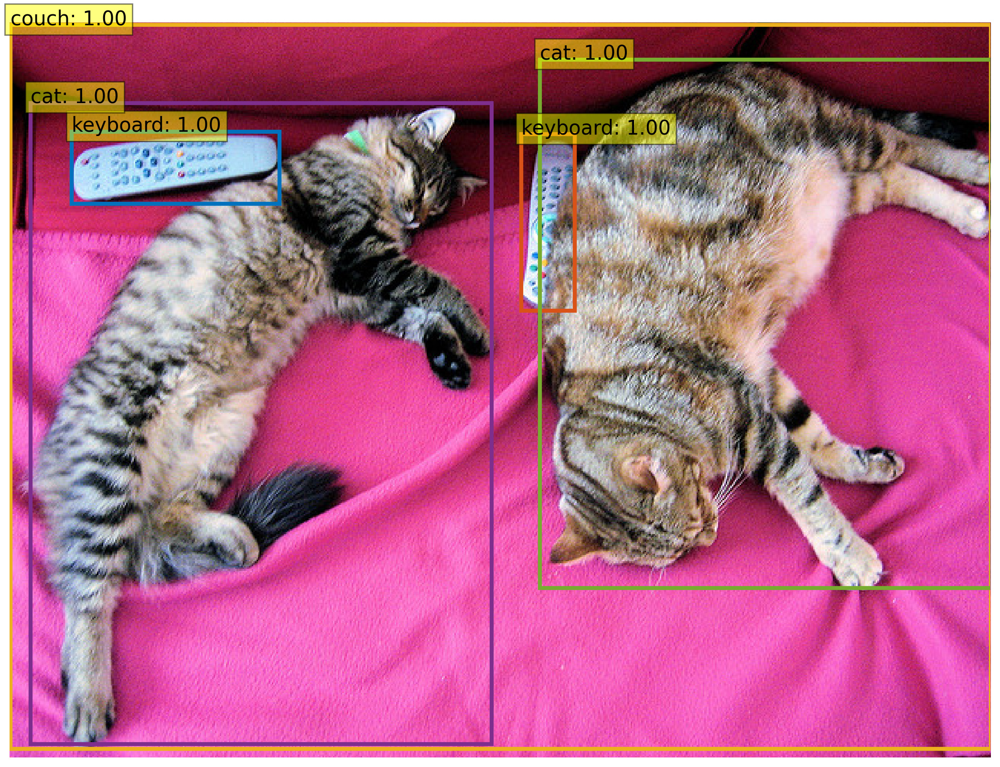

In [ ]:
plot_results(im, probas[keep], bboxes_scaled)

### Part 2: Understand what is an object query and visualize how DETR use it to represent potential objects in an image. 

Let's try to understand how the model localizes and identifies the bounding box for each detected object, so that we can better understand what the model "sees" for a specific query. 

To start, it is important to understand what is object query in DETR. Unliked most object detection models that preict bounding boxes from predefined anchor boxes or region proposals, DETR does not require any initial guesses. It uses object queries to represent potential objects in an image. 

Object queries are learnable embeddings. They are initialized randomly at the start of training. The model need to preset with a fixed number of queries (e.g. 100), which means that it can predict up to 100 objects (N=100) per image. It is also worth noting that in a DETR model, the default setting of object queries is 100. We will also play with the query number later in this notebook to see how the prediction might change when N changes. 

How are object queries used? 
During the decoders' cross attention, each object query can interact with image feature (the output embeddings come out from the encoder) and gather info about the potential objects. As we iterate through the decoder layer ("M" - see detailed architecture), the object queries will slowly refine their knowledge about specific object in the image. 

Here, we want to visualize the attention weights of the first, third, and the last decoder layer. This is similar to visualize the detected objects, which is represented by object queries. Hooks are used for extracting attention weights.

In [49]:
# use lists to store the outputs via up-values
conv_features, enc_attn_weights, dec_attn_weights = [], [], []

hooks = [
    model.backbone[-2].register_forward_hook(
        lambda self, input, output: conv_features.append(output)
    ),
    model.transformer.encoder.layers[-1].self_attn.register_forward_hook(
        lambda self, input, output: enc_attn_weights.append(output[1])
    ),
    model.transformer.decoder.layers[-1].multihead_attn.register_forward_hook(
        lambda self, input, output: dec_attn_weights.append(output[1])
    ),
]

# propagate through the model
outputs = model(img)

for hook in hooks:
    hook.remove()

# don't need the list anymore
conv_features = conv_features[0]
enc_attn_weights = enc_attn_weights[0]
dec_attn_weights = dec_attn_weights[0]

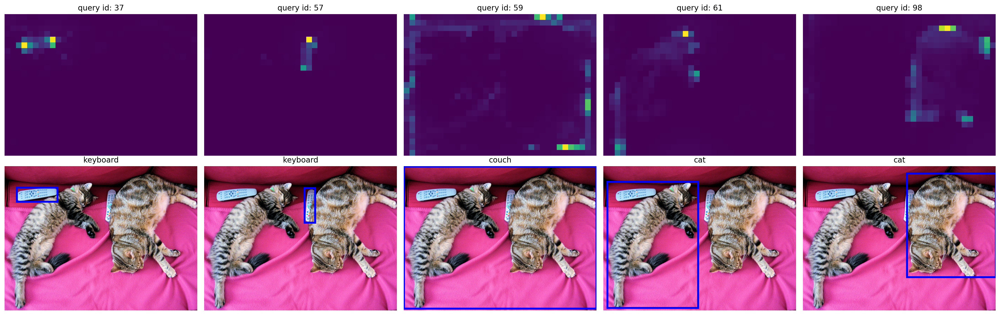

In [50]:
# get the feature map shape
h, w = conv_features['0'].tensors.shape[-2:]

fig, axs = plt.subplots(ncols=len(bboxes_scaled), nrows=2, figsize=(22, 7))
colors = COLORS * 100
for idx, ax_i, (xmin, ymin, xmax, ymax) in zip(keep.nonzero(), axs.T, bboxes_scaled):
    ax = ax_i[0]
    ax.imshow(dec_attn_weights[0, idx].view(h, w))
    ax.axis('off')
    ax.set_title(f'query id: {idx.item()}')
    ax = ax_i[1]
    ax.imshow(im)
    ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                               fill=False, color='blue', linewidth=3))
    ax.axis('off')
    ax.set_title(CLASSES[probas[idx].argmax()])
fig.tight_layout()

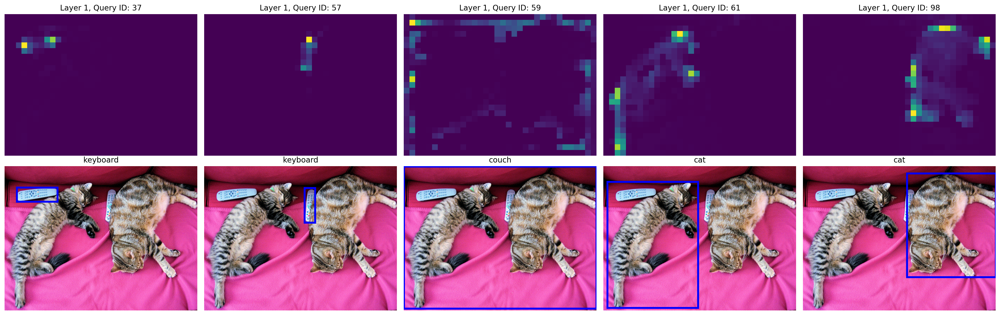

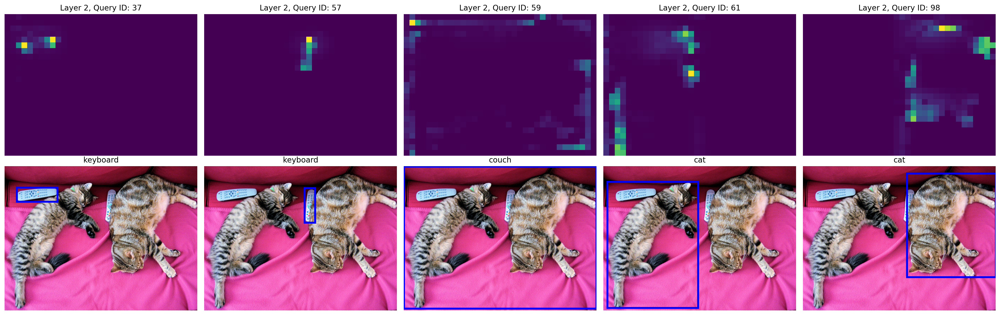

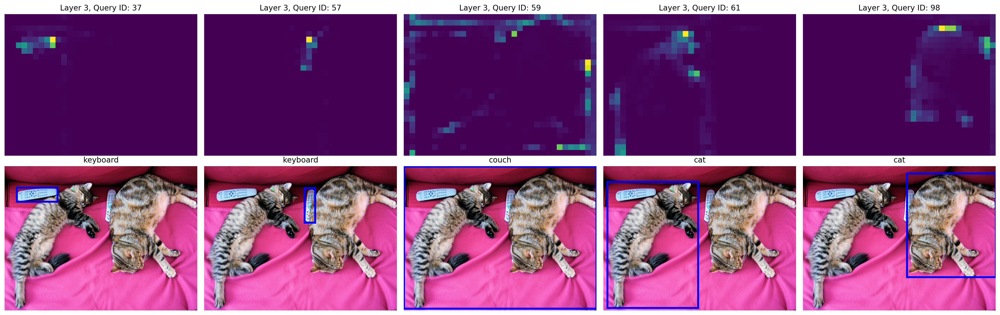

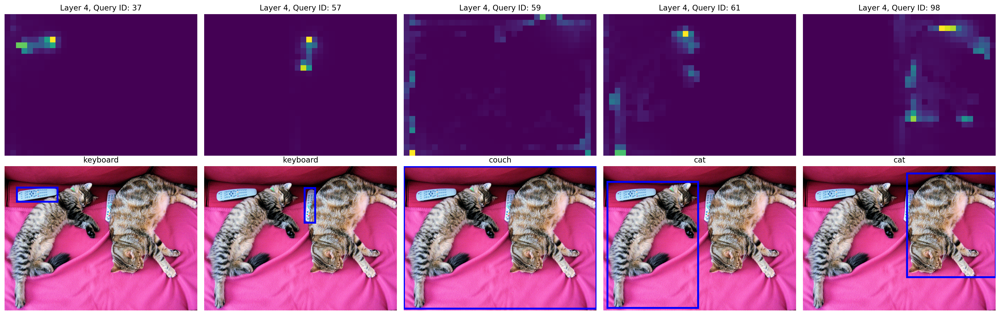

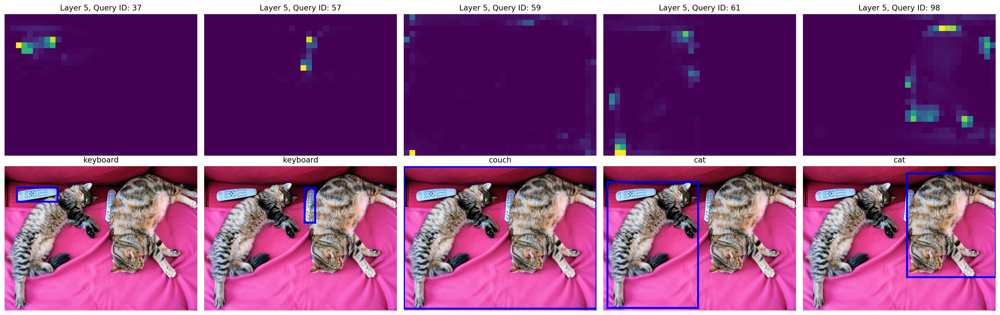

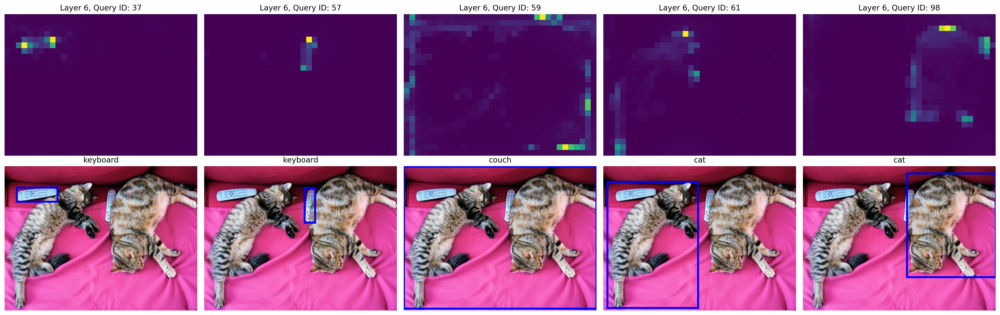

In [51]:
# Initialize lists to store attention weights from all decoder layers
all_dec_attn_weights = []

# Hook for all decoder layers
hooks = [
    layer.multihead_attn.register_forward_hook(
        lambda self, input, output: all_dec_attn_weights.append(output[1])
    )
    for layer in model.transformer.decoder.layers
]

# Pass the image through the model
outputs = model(img)

# Remove hooks after forward pass
for hook in hooks:
    hook.remove()

# Get the feature map dimensions
h, w = conv_features['0'].tensors.shape[-2:]

# Iterate over decoder layers and visualize attention maps
# there should be six decoder layers
for layer_idx, dec_attn_weights in enumerate(all_dec_attn_weights):
    fig, axs = plt.subplots(ncols=len(bboxes_scaled), nrows=2, figsize=(22, 7))
    colors = COLORS * 100

    for idx, ax_i, (xmin, ymin, xmax, ymax) in zip(keep.nonzero(), axs.T, bboxes_scaled):
        # Row 1: Attention map for each query
        ax = ax_i[0]
        ax.imshow(dec_attn_weights[0, idx].view(h, w))  # Attention map for this layer
        ax.axis('off')
        ax.set_title(f'Layer {layer_idx + 1}, Query ID: {idx.item()}')

        # Row 2: Image with bounding box
        ax = ax_i[1]
        ax.imshow(im)
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color='blue', linewidth=3))
        ax.axis('off')
        ax.set_title(CLASSES[probas[idx].argmax()])
    
    fig.tight_layout()
    plt.show()


## Part 3: Delete a class label, what happened? 

In order to not mess up with this notebook, we created a second notebook named "classlabel.ipynb" to show you this. 